<a href="https://colab.research.google.com/github/phucb2/deep-learning-courses/blob/main/BearClassifier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Setup

In [1]:

#hide
! [ -e /content ] && pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.8/719.8 kB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 40.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.6/519.6 kB 39.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 63.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 13.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 20.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 15.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 28.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 94.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 75.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 82.9 MB/s eta 0:00:00
Mounted at /content/gdrive


# Bear classifier example

In [2]:
#hide
from fastbook import *
from fastai.vision.widgets import *

In [3]:
search_images_ddg

<function fastbook.search_images_ddg(term, max_images=200)>

In [4]:
results = search_images_ddg('grizzly bear')

In [ ]:
results[0]

'https://live.staticflickr.com/4858/45241138615_5be18bee13.jpg'

In [ ]:
dest = 'images/grizzly.jpg'
download_url(results[0], dest)

Path('images/grizzly.jpg')

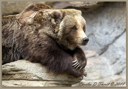

In [ ]:
im = Image.open(dest)
im.to_thumb(128,128)

In [ ]:
from tqdm.notebook import tqdm

In [ ]:
path = Path('bears')
bear_types = 'grizzly', 'black', 'teddy'
if not path.exists():
  path.mkdir()
  for o in bear_types:
    dest = path / o
    results = search_images_ddg(f"{o} bear")
    download_images(dest, urls = results)

In [ ]:
fns = get_image_files(path)
fns

(#573) [Path('bears/teddy/6eebdabf-de2c-4942-bb75-f6f5524fbf46.jpg'),Path('bears/teddy/9ba1e850-8ac2-41d9-8a72-064b019aeb9f.jpg'),Path('bears/teddy/a8296283-692e-4dc9-92c1-017b382c30c4.jpg'),Path('bears/teddy/3413aaa1-c4a7-4926-bd42-314401a6f4ef.jpg'),Path('bears/teddy/91911513-4b64-4085-b3c5-a8b15f8c1826.jpg'),Path('bears/teddy/33c7b4fd-a7c6-47c8-acd3-96f8b21faf6e.jpg'),Path('bears/teddy/3d9a7098-7aed-4028-b3dc-14b66dbdf885.jpg'),Path('bears/teddy/fa3ad4fe-d635-4673-9b52-5294f7e5f811.jpg'),Path('bears/teddy/38e75b7b-7f46-4609-9cc1-9aec80eb6249.jpg'),Path('bears/teddy/b3b509ec-57a0-46c5-9ac1-28aefc418e03.jpg')...]

In [ ]:
failed = verify_images(fns)
failed

(#26) [Path('bears/teddy/9449d600-1a71-41c5-8fbf-9ae53077af03.jpg'),Path('bears/teddy/3c0419cd-a0f1-4242-92e9-649656072e9d.JPG'),Path('bears/teddy/e471d986-16de-488b-b335-b66b166a904a.jpg'),Path('bears/teddy/81d64d44-7850-4c2b-9445-6986f1aec43a.jpg'),Path('bears/teddy/2c331dc8-37d1-4ac6-b72e-6ee8dd5ce24f.jpg'),Path('bears/teddy/92c87c6f-9fff-4b41-9cb5-3898e394114c.jpg'),Path('bears/teddy/d910d82f-511b-480b-9bd4-48dca6622250.jpg'),Path('bears/teddy/fa88d727-e7ac-41e3-8efb-ab118fbe3d98.jpg'),Path('bears/teddy/661cc5d0-93b6-4a4f-98fc-b82f88bc59ba.JPG'),Path('bears/teddy/b9a99ec7-4b02-472d-98db-a84eb1469f49.JPG')...]

In [ ]:
failed.map(Path.unlink);

In [ ]:
bears = DataBlock(blocks=(ImageBlock, CategoryBlock), get_items = get_image_files, splitter = RandomSplitter(valid_pct=0.2, seed=0), get_y=parent_label, item_tfms=Resize(128))

In [ ]:
dls = bears.dataloaders(path)

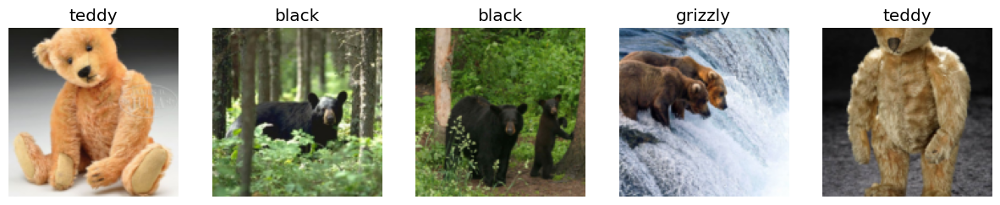

In [ ]:
dls.train.show_batch(max_n = 5, nrows=1)

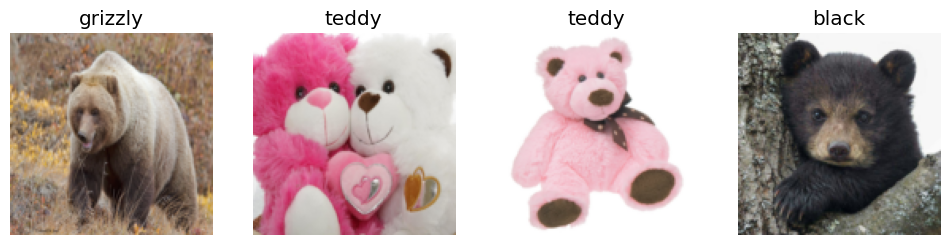

In [ ]:
bears = bears.new(item_tfms=Resize(128, ResizeMethod.Squish))
dls = bears.dataloaders(path)
dls.valid.show_batch(max_n=4,nrows=1)

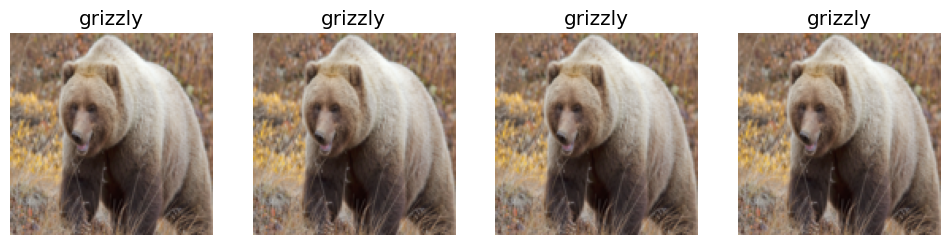

In [ ]:
bears = bears.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))
dls = bears.dataloaders(path)
dls.valid.show_batch(max_n=4,nrows=1, unique=True)

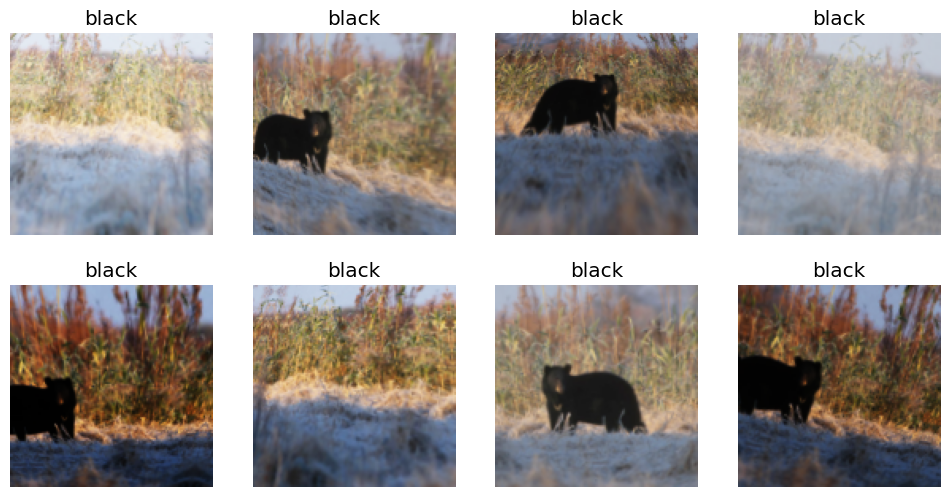

In [ ]:
bears = bears.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))
dls = bears.dataloaders(path)
dls.train.show_batch(max_n=8,nrows=2,unique=True)

In [ ]:
bears = bears.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms()
)

dls = bears.dataloaders(path)

In [ ]:
learn = vision_learner(dls, resnet18,metrics=error_rate)
learn.fine_tune(4)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 327MB/s]


epoch,train_loss,valid_loss,error_rate,time
0,1.421508,0.156518,0.036697,00:11


epoch,train_loss,valid_loss,error_rate,time
0,0.255152,0.166303,0.036697,00:07
1,0.207422,0.131490,0.045872,00:07
2,0.176441,0.137155,0.055046,00:07
3,0.154788,0.135610,0.045872,00:07


In [ ]:
interp = ClassificationInterpretation.from_learner(learn)

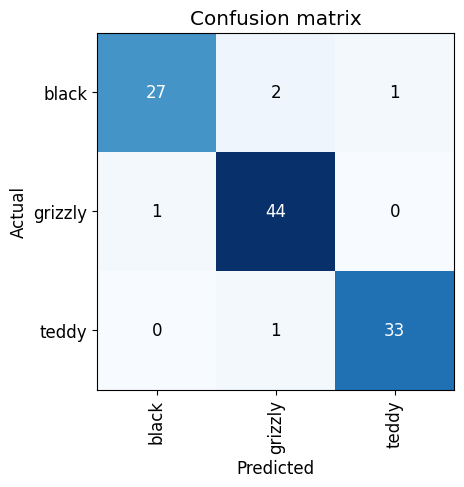

In [ ]:
interp.plot_confusion_matrix()

In [ ]:
!ls images

grizzly.jpg


In [ ]:
learn.predict('images/grizzly.jpg')

('grizzly', tensor(1), tensor([1.7324e-04, 9.9772e-01, 2.1051e-03]))

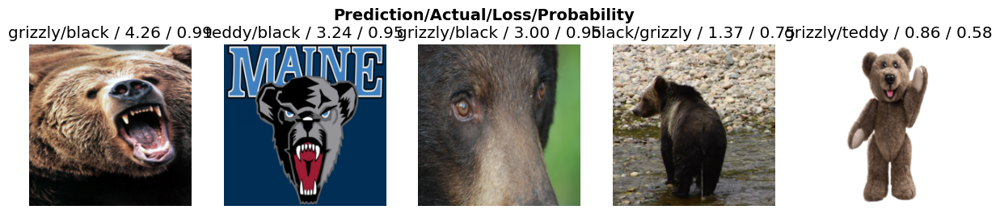

In [ ]:
interp.plot_top_losses(5,nrows=1)

In [ ]:
cleaner = ImageClassifierCleaner(learn)

In [ ]:
cleaner

In [ ]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

In [ ]:
learn.export()

In [ ]:
!ls

bears  export.pkl  gdrive  images  sample_data


In [ ]:
!cp export.pkl "/content/gdrive/MyDrive/"

# Cat vs dogs classifer

List of all types of cats:
```
Persian
Maine Coon
Siamese
Ragdoll
Bengal
Scottish Fold
Sphynx
British Shorthair
Abyssinian
Birman
Burmese
Russian Blue
Devon Rex
Cornish Rex
American Shorthair
Oriental Shorthair
Manx
Turkish Van
Somali
Norwegian Forest Cat
Balinese
Tonkinese
Himalayan
Exotic Shorthair
Scottish Straight
American Curl
Japanese Bobtail
Turkish Angora
Chartreux
Selkirk Rex
```

In [37]:
cat_breeds = [
    "Persian",
    "Maine Coon",
    "Siamese",
    "Ragdoll",
    "Bengal",
    "Scottish Fold",
    "Sphynx",
    "British Shorthair",
    "Abyssinian",
    "Birman",
    "Burmese",
    "Russian Blue",
    "Devon Rex",
    "Cornish Rex",
    "American Shorthair",
    "Oriental Shorthair",
    "Manx",
    "Turkish Van",
    "Somali",
    "Norwegian Forest Cat",
    "Balinese",
    "Tonkinese",
    "Himalayan",
    "Exotic Shorthair",
    "Scottish Straight",
    "American Curl",
    "Japanese Bobtail",
    "Turkish Angora",
    "Chartreux",
    "Selkirk Rex"
]

Craw images

In [38]:
from tqdm.notebook import tqdm

In [40]:
path = Path('cat_breeds_v3')
if not path.exists():
  path.mkdir()
  for o in tqdm(cat_breeds):
    dest = path / o
    results = search_images_ddg(f"{o} cat")
    download_images(dest, urls = results)
else:
  print("Folder already exist")

  0%|          | 0/30 [00:00<?, ?it/s]

In [55]:
fns = get_image_files(path)

In [56]:
failed = verify_images(fns)
failed

/usr/local/lib/python3.10/dist-packages/PIL/TiffImagePlugin.py:858: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 2. 
  warnings.warn(str(msg))


(#0) []

In [57]:
len(failed)

0

In [48]:
failed.map(Path.unlink);

In [49]:
cat_breeds = DataBlock(blocks=(ImageBlock, CategoryBlock),
                  get_items = get_image_files,
                  splitter = RandomSplitter(valid_pct=0.2, seed=0),
                  get_y=parent_label,
                  item_tfms=Resize(228))

In [50]:
cat_breeds = cat_breeds.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms()
)

dls = cat_breeds.dataloaders(path)

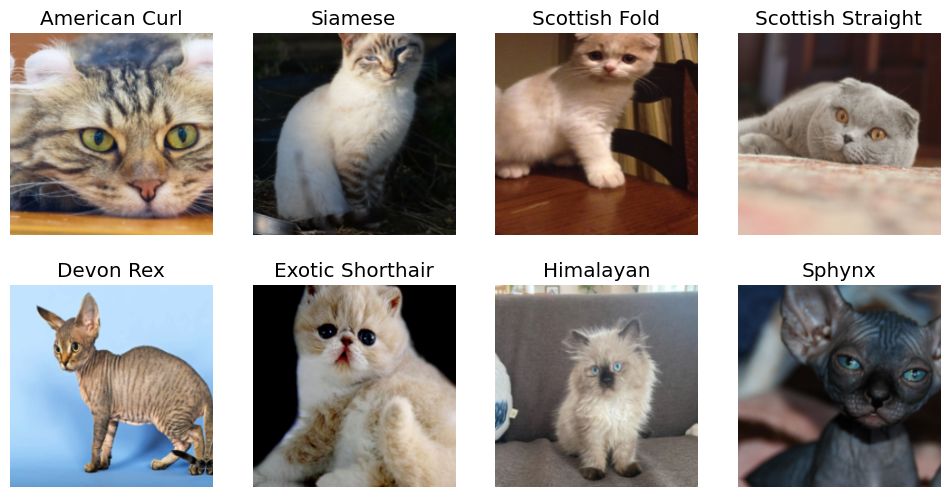

In [51]:
dls.train.show_batch(max_n=8,nrows=2)

In [52]:
learn = vision_learner(dls, resnet18,metrics=error_rate)
learn.fine_tune(4)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


epoch,train_loss,valid_loss,error_rate,time
0,3.095953,1.472106,0.438455,00:34


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/TiffImagePlugin.py:858: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 2. 
  warnings.warn(str(msg))
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


epoch,train_loss,valid_loss,error_rate,time
0,1.756156,1.329595,0.402516,00:34
1,1.465940,1.154061,0.341420,00:33
2,1.179838,1.065146,0.318059,00:33
3,0.999107,1.010485,0.304582,00:34


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/TiffImagePlugin.py:858: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 2. 
  warnings.warn(str(msg))
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should 

In [ ]:
!cp -r "/content/cat_breeds" "/content/gdrive/MyDrive/ColabData/"

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


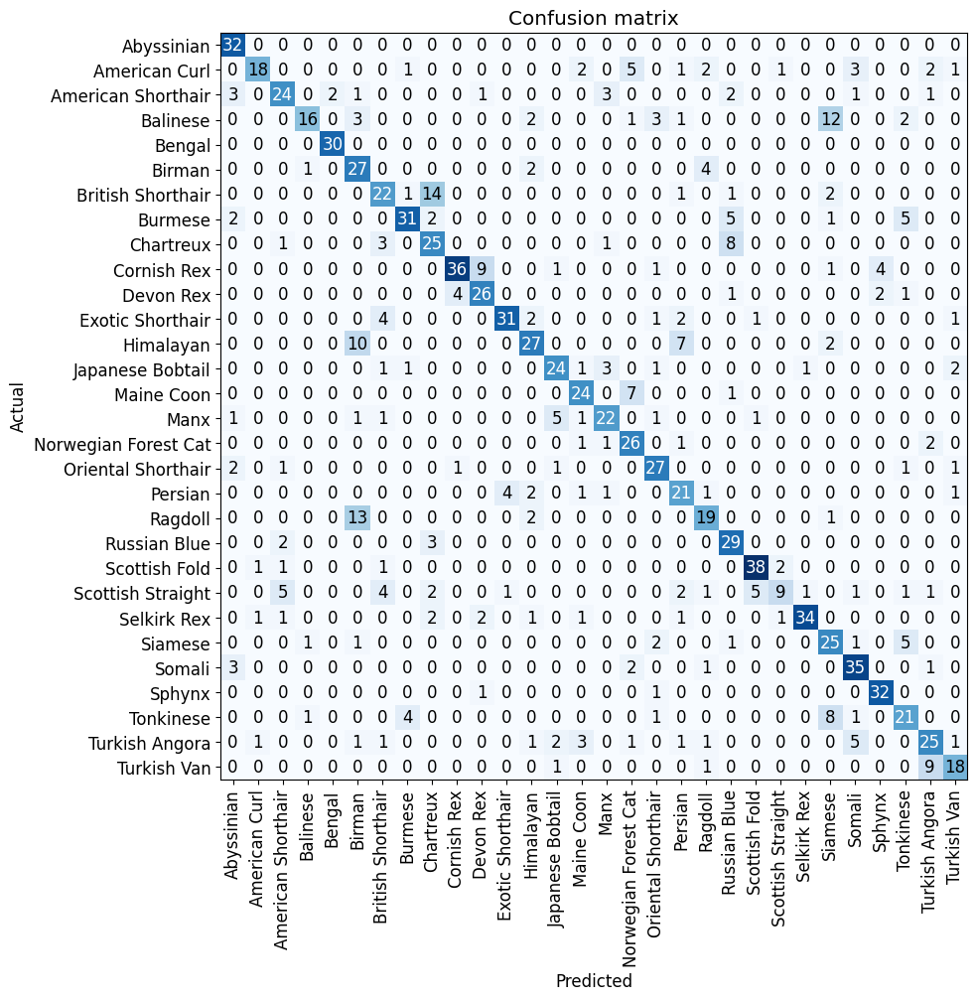

In [58]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(figsize = (10, 10))

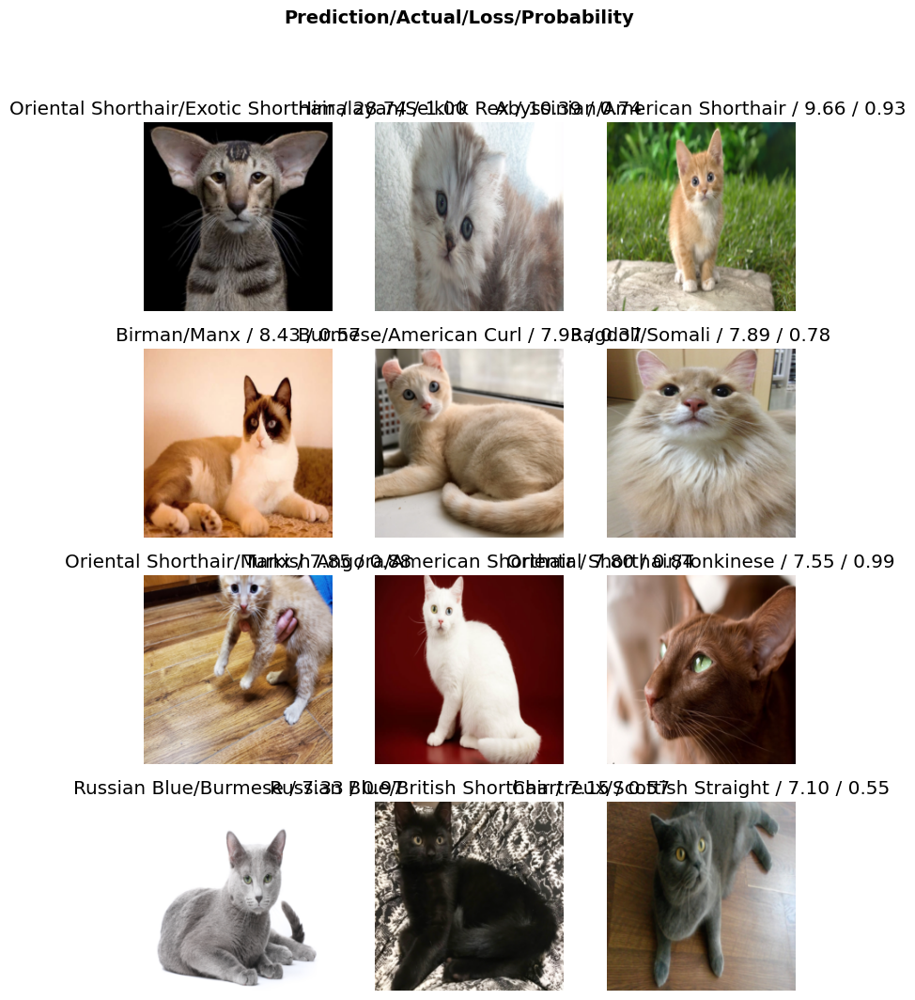

In [61]:
interp.plot_top_losses(12,nrows=4)

In [62]:
cleaner = ImageClassifierCleaner(learn)

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/TiffImagePlugin.py:858: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 2. 
  warnings.warn(str(msg))


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


In [63]:
cleaner

In [64]:
categories = learn.dls.vocab

def classify_image(img):
    pred,idx,probs = learn.predict(img)
    return dict(zip(categories, map(float,probs)))

In [66]:
from google.colab import auth
auth.authenticate_user()

# https://cloud.google.com/resource-manager/docs/creating-managing-projects
project_id = 'turing-opus-703'
!gcloud config set project {project_id}

Updated property [core/project].


In [67]:
bucket_name = 'colab-storage-phuc-bui'


In [ ]:
!gsutil -m cp -r /content/cat_breeds_v3 gs://{bucket_name}/Cat_Breeds_V1/

In [72]:
learn.export()

In [73]:
!ls

cat_breeds  cat_breeds_v3  export.pkl  gdrive  sample_data


In [74]:
!gsutil cp export.pkl gs://{bucket_name}/

Copying file://export.pkl [Content-Type=application/octet-stream]...
\ [1 files][ 44.9 MiB/ 44.9 MiB]                                                
Operation completed over 1 objects/44.9 MiB.                                     
